In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from pandas_profiling import ProfileReport

In [29]:
#state wise data set
df1 = pd.read_csv('crime_by_state_rt.csv')   #DataFrame original

In [7]:
df =df1.set_index('Year')

In [11]:
df.reset_index(inplace=True)
df.head()

,Year,STATE/UT,Murder,Assault on women,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs
0,2001,ANDHRA PRADESH,45,69,22,3,2,6,518,950,312,1006
1,2002,ANDHRA PRADESH,60,98,18,0,4,12,568,830,459,1336
2,2003,ANDHRA PRADESH,33,79,27,1,15,4,615,1234,165,1386
3,2004,ANDHRA PRADESH,39,66,28,0,7,20,474,1319,68,1234
4,2005,ANDHRA PRADESH,37,74,21,0,0,9,459,1244,61,1212


In [19]:
df_groupby_state = df.groupby(df["STATE/UT"]).sum()
df_groupby_state.reset_index(inplace=True)
df_groupby_state.head()

,STATE/UT,Year,Murder,Assault on women,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs
0,A & N ISLANDS,24078,0,0,0,0,0,0,0,0,0,0
1,ANDHRA PRADESH,24078,556,1110,238,9,39,136,7248,15160,1511,17412
2,ARUNACHAL PRADESH,24078,1,0,0,0,1,0,0,0,0,0
3,ASSAM,24078,57,57,96,14,33,25,341,3,1,318
4,BIHAR,24078,286,284,127,29,77,309,4524,23425,466,3814


In [15]:
df['STATE/UT'].nunique()

35

In [16]:
df.isnull().any()

#no NUll and missing values in dataset

Year                                    False
STATE/UT                                False
Murder                                  False
Assault on women                        False
Kidnapping and Abduction                False
Dacoity                                 False
Robbery                                 False
Arson                                   False
Hurt                                    False
Prevention of atrocities (POA) Act      False
Protection of Civil Rights (PCR) Act    False
Other Crimes Against SCs                False
dtype: bool

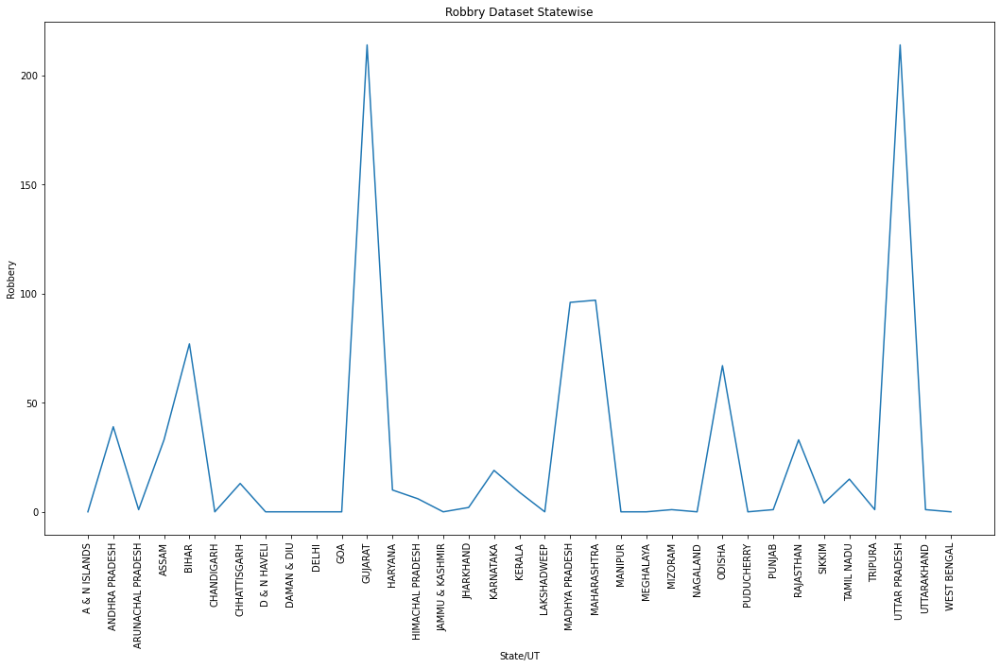

In [24]:
plt.figure(figsize=(18,10))
plt.plot(df_groupby_state['STATE/UT'],df_groupby_state['Robbery'])
plt.xticks(rotation=90)
plt.xlabel('State/UT')
plt.ylabel('Robbery')
plt.title('Robbry Dataset Statewise')
plt.show()

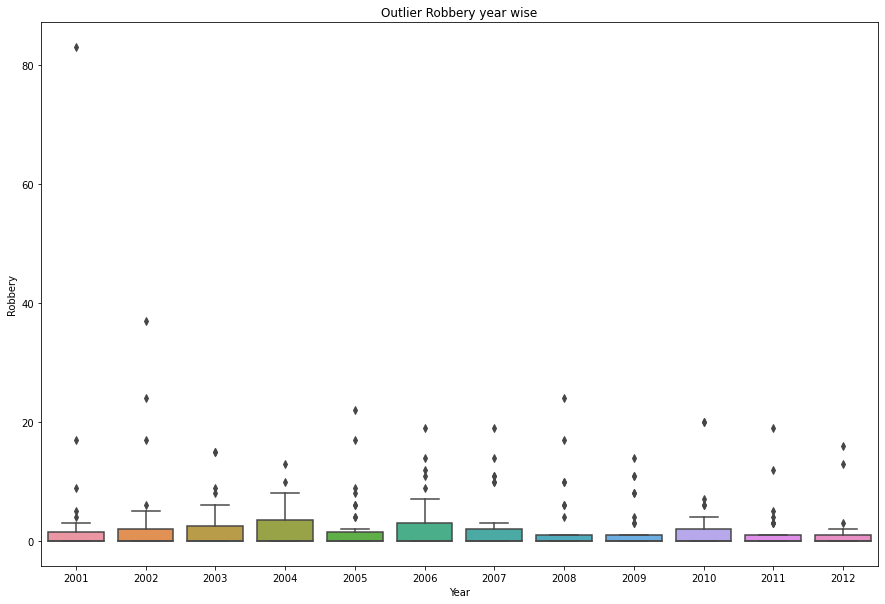

In [25]:
plt.figure(figsize=(15,10))
ax = sns.boxplot(x="Year", y="Robbery", data=df1).set_title('Outlier Robbery year wise')
plt.show()

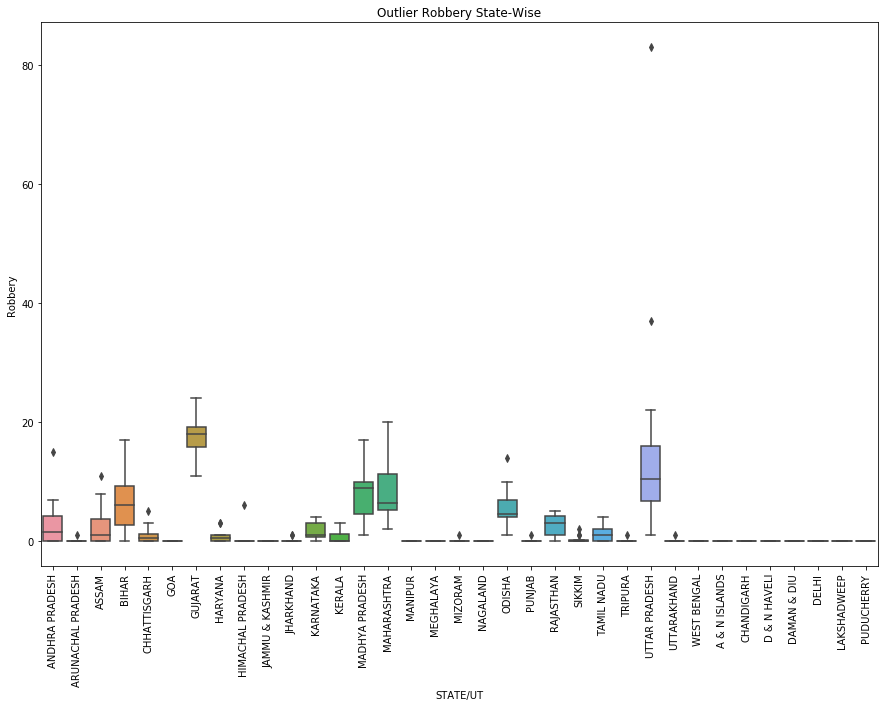

In [9]:
plt.figure(figsize=(15,10))
ax = sns.boxplot(x ='STATE/UT', y ='Robbery', data =df).set_title('Outlier Robbery State-Wise')
plt.xticks(rotation=90)
plt.show()

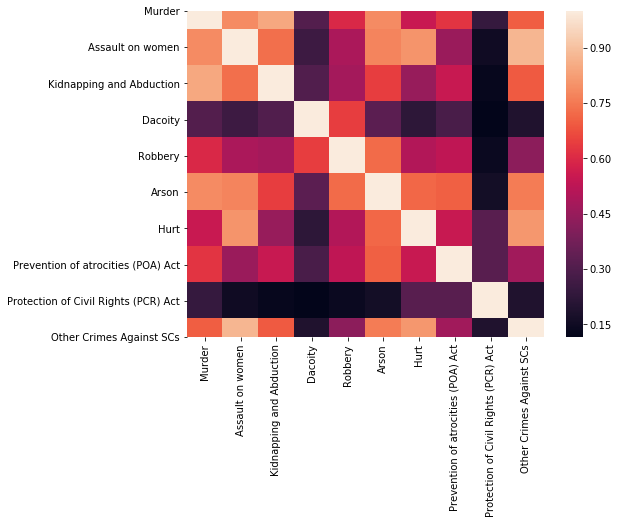

In [285]:
plt.figure(figsize=(8,6))
corr = df.corr()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)
plt.show()

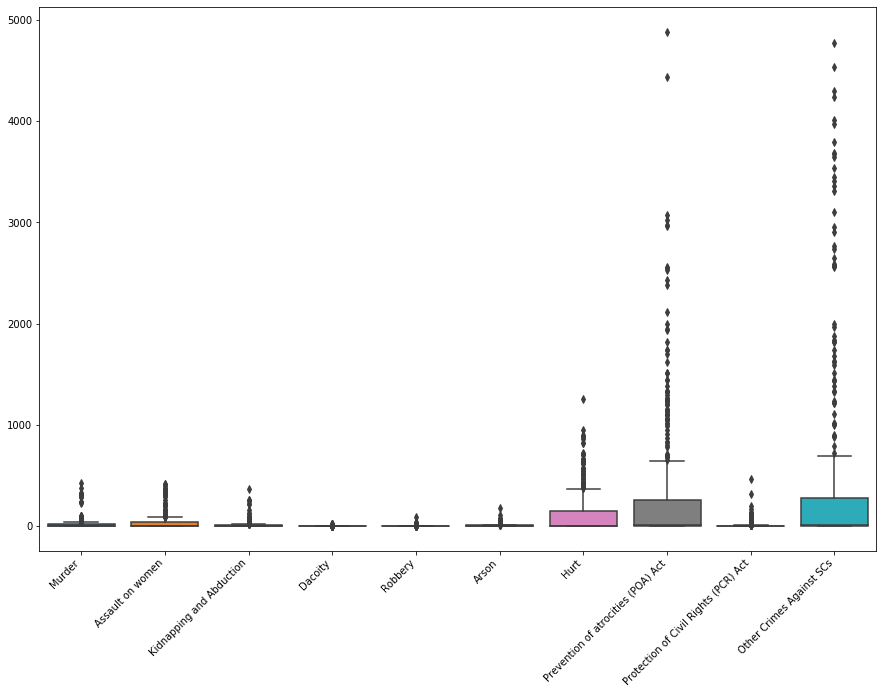

In [286]:
plt.figure(figsize=(15,10))
ax =sns.boxplot(data=df)
for label in ax.get_xticklabels():
    label.set_ha("right")
    label.set_rotation(45)

In [44]:
df['TotalCrime'] = df.sum(numeric_only=True, axis=1) #dataframe with year index
#df.loc['Column_Total']= df.sum(numeric_only=True, axis=0)

In [46]:
df.columns

Index(['Year', 'STATE/UT', 'Murder', 'Assault on women',
       'Kidnapping and Abduction', 'Dacoity', 'Robbery', 'Arson', 'Hurt',
       'Prevention of atrocities (POA) Act',
       'Protection of Civil Rights (PCR) Act', 'Other Crimes Against SCs',
       'TotalCrime'],
      dtype='object')

In [49]:
df_max = df.groupby(['STATE/UT']).max().sort_values(by='TotalCrime',ascending=False)
df_max.reset_index(inplace=True)
df_max.head()

,STATE/UT,Year,Murder,Assault on women,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs,TotalCrime
0,UTTAR PRADESH,2012.0,423.0,412.0,363.0,16.0,83.0,178.0,821.0,4885.0,133.0,4296.0,50932.0
1,MADHYA PRADESH,2012.0,102.0,412.0,69.0,3.0,17.0,62.0,1252.0,570.0,5.0,4771.0,36876.0
2,RAJASTHAN,2012.0,66.0,216.0,51.0,1.0,5.0,76.0,636.0,2965.0,5.0,4536.0,30284.0
3,BIHAR,2012.0,46.0,39.0,29.0,7.0,17.0,47.0,539.0,4436.0,113.0,661.0,27332.0
4,ANDHRA PRADESH,2012.0,64.0,131.0,28.0,3.0,15.0,20.0,722.0,1737.0,459.0,1874.0,26052.0


## Top 10 Crime State

In [59]:
top = df_max[:10]
print(list(top["STATE/UT"]))

['UTTAR PRADESH', 'MADHYA PRADESH', 'RAJASTHAN', 'BIHAR', 'ANDHRA PRADESH', 'KARNATAKA', 'TAMIL NADU', 'ODISHA', 'GUJARAT', 'MAHARASHTRA']


In [64]:
df_up = df[df['STATE/UT'] == 'UTTAR PRADESH']
df_mp = df[df['STATE/UT'] == 'MADHYA PRADESH']
df_raj = df[df['STATE/UT'] == 'RAJASTHAN']

In [66]:
df_up.groupby('STATE/UT').max()

,Year,Murder,Assault on women,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs,TotalCrime
STATE/UT,,,,,,,,,,,,
UTTAR PRADESH,2012.0,423.0,412.0,363.0,16.0,83.0,178.0,821.0,4885.0,133.0,4296.0,50932.0


In [67]:
df_mp.groupby('STATE/UT').max()

,Year,Murder,Assault on women,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs,TotalCrime
STATE/UT,,,,,,,,,,,,
MADHYA PRADESH,2012.0,102.0,412.0,69.0,3.0,17.0,62.0,1252.0,570.0,5.0,4771.0,36876.0


In [68]:
df_raj.groupby('STATE/UT').max()

,Year,Murder,Assault on women,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs,TotalCrime
STATE/UT,,,,,,,,,,,,
RAJASTHAN,2012.0,66.0,216.0,51.0,1.0,5.0,76.0,636.0,2965.0,5.0,4536.0,30284.0


In [69]:
profile = ProfileReport(df)

In [70]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
# to save output as intractive html format
#profile.to_file(output_file="your_report.html")

# Conclusion
- Uttar-Pradesh has maximum crime rate in 2001.
- TotalCrime rate in up is more than any other state in 2001,2002,2008,2009,2011.
- After UP, Mp has 7217 Crimes in 2002.
- Rajsthan has lot of crime rate in 2009,2010,2011 followed by UP and Mp.
- Maximum muder Was Done in the Year of 2001 in Uttar Pradesh
- 2012 Is Maximum Crime Year In UP, Mp And Rajstahn.
#### After Conclusion ,Crime States Are
1. Up
2. Rajsthan
2. Mp


#### Top 10 Crime States Are 
- Uttar Pradesh
- Madhya Preadesh 
- Rajasthan 
- Bihar
- Andhra Pradesh
- Karnataka
- TamilNadu
- Odisha
- Gujarat
- Maharashtra